In [350]:
from wrapper_functions import *

# Experiment II: 2D Spatial Field

### Model Configs

In [351]:
# Optimization configs. 
# Consider reduce below parameters / set to `False` if MCMC is taking too long:
# mcmc_num_steps, mcmc_burnin, mcmc_nchain, mcmc_initialize_from_map.
map_step_size=5e-4   # @param
map_num_steps=10_000  # @param

mcmc_step_size=1e-4 # @param
mcmc_num_steps=1000 # @param

mcmc_nchain=10 # @param
mcmc_burnin=2_500 # @param
bne_mcmc_initialize_from_map="True" # @param ["False", "True"]

bne_mcmc_initialize_from_map = eval(bne_mcmc_initialize_from_map)

# BMA parameters.
y_noise_std = 0.01  # Note: Changed from 0.1 # @param
bma_gp_lengthscale = .25 # @param
bma_gp_l2_regularizer = 1 # @param

bma_n_samples_train = 100 # @param
bma_n_samples_eval = 250 # @param
bma_n_samples_test = 250 # @param
bma_seed = 0 # @param

# BNE parameters.
bne_gp_lengthscale = .08 # 5. # @param
bne_gp_l2_regularizer = 1. # 15 # @param
bne_variance_prior_mean = -2.5 # @param
bne_skewness_prior_mean = -2.5 # @param
bne_seed = 0 # @param


### Read training/prediction data

In [352]:
training_eastMA = pd.read_csv('../data/training_dataset/training_eastMA.csv')
training_eastMA_noMI = training_eastMA[:51]
training_eastMA_folds = pd.read_csv('../data/training_dataset/training_eastMA_folds.csv')
base_model_predictions_eastMA = pd.read_csv('../data/prediction_dataset/base_model_predictions_eastMA.csv')
display(training_eastMA.shape, training_eastMA_folds.shape, base_model_predictions_eastMA.shape)
print("pred longitude max and min", base_model_predictions_eastMA["lon"].max(),base_model_predictions_eastMA["lon"].min())
print("pred latitude max and min", base_model_predictions_eastMA["lat"].max(),base_model_predictions_eastMA["lat"].min())
#list(base_model_predictions_eastMA.columns)
print("train longitude max and min", training_eastMA["lon"].max(),training_eastMA["lon"].min())
print("train latitude max and min", training_eastMA["lat"].max(),training_eastMA["lat"].min())


training51= pd.read_csv('../data/training_dataset/training51.csv')

# standardize
X_train1 = np.asarray(training_eastMA_noMI[["lon", "lat"]].values.tolist()).astype(np.float32)
X_test1 = np.asarray(base_model_predictions_eastMA[["lon", "lat"]].values.tolist()).astype(np.float32)
X_valid = np.concatenate((X_train1, X_test1), axis=0)
X_centr = np.mean(X_valid, axis=0)
X_scale = np.max(X_valid, axis=0) - np.min(X_valid, axis=0)

X_train1 = (X_train1 - X_centr) / X_scale
X_test1 = (X_test1 - X_centr) / X_scale

Y_train = np.expand_dims(training_eastMA_noMI["aqs"], 1).astype(np.float32)
#Y_test = np.expand_dims(base_model_predictions_eastMA["pred_av"], 1).astype(np.float32)

print("2011 center and scale: ", X_centr, X_scale)

base_model_names = ["pred_av", "pred_gs", "pred_caces"]
base_preds_train = tf.stack([training_eastMA_noMI[base_model_name].astype(np.float32) for base_model_name in base_model_names], axis=-1)
base_preds_test = tf.stack([base_model_predictions_eastMA[base_model_name].astype(np.float32) for base_model_name in base_model_names], axis=-1)
#base_preds_test
display(base_preds_train.shape, base_preds_test.shape)

(55, 7)

(55, 10)

(84421, 5)

pred longitude max and min -69.93 -73.5
pred latitude max and min 44.3 40.6
train longitude max and min -70.023598 -73.443056
train latitude max and min 44.107524 40.74529
2011 center and scale:  [-72.185104  42.680347] [3.5699997 3.7000008]


TensorShape([51, 3])

TensorShape([84421, 3])

## Bayesian Model Averaging

A Bayesian ensemble model where ensemble weights $w_k's$ are parameterized by Gaussian process priors:

$y \sim N(\mu(x), \sigma^2)$ 

$\mu(x) = \sum_{k=1}^K w_k(x) * m_k(x) \quad$  where $\{m_k\}_{k=1}^K$ are base model predictions.

$w(x) = softmax(f(x)) \qquad\;\;\;$ where $w=[w_1, \dots, w_K]$ and $f=[f_1, \dots, f_K]$

$f \stackrel{i.i.d.}{\sim} GaussianProcess(0, k)$




## Bayesian Additive Ensemble

Given $\mu(x)$ the posterior of a Bayesian ensemble model, the Bayesian Additive Ensemble is defined as:    

$y \sim N(\mu(x) + r(x), \sigma^2)$

$r \sim GaussianProcess(0, k)$

The additive ensemble $r(x)$ services two purposes: 

1. Mitigates systematic bias in model prediction; 
2. Quantifies the model's epistemic uncertainty.

**Prepare Data Dict**

In [353]:
data_dicts = dict(X_train = X_train1,
                  X_test=X_test1,
                  Y_train = Y_train,
                  base_preds_train = base_preds_train,
                  base_preds_test = base_preds_test)

In [354]:
bma_config=dict(gp_lengthscale=bma_gp_lengthscale,
                gp_l2_regularizer=bma_gp_l2_regularizer,
                y_noise_std=y_noise_std,
                map_step_size=map_step_size,
                map_num_steps=map_num_steps,
                mcmc_step_size=mcmc_step_size,
                mcmc_num_steps=mcmc_num_steps,
                mcmc_initialize_from_map=False,
                n_samples_eval=bma_n_samples_eval,
                n_samples_train=bma_n_samples_train,
                n_samples_test=bma_n_samples_test,
                seed=bma_seed)

bne_config = dict(gp_lengthscale=bne_gp_lengthscale,
                  gp_l2_regularizer=bne_gp_l2_regularizer,
                  variance_prior_mean=bne_variance_prior_mean,
                  skewness_prior_mean=bne_skewness_prior_mean,
                  map_step_size=map_step_size,
                  map_num_steps=map_num_steps,
                  mcmc_step_size=mcmc_step_size,
                  mcmc_num_steps=mcmc_num_steps,
                  mcmc_nchain=mcmc_nchain,
                  mcmc_burnin=mcmc_burnin,
                  mcmc_initialize_from_map=bne_mcmc_initialize_from_map,
                  seed=bne_seed)

In [355]:
bma_config

{'gp_lengthscale': 0.25,
 'gp_l2_regularizer': 1,
 'y_noise_std': 0.01,
 'map_step_size': 0.0005,
 'map_num_steps': 10000,
 'mcmc_step_size': 0.0001,
 'mcmc_num_steps': 1000,
 'mcmc_initialize_from_map': False,
 'n_samples_eval': 250,
 'n_samples_train': 100,
 'n_samples_test': 250,
 'seed': 0}

In [356]:
# BMA-mean.
print('BMA-mean:', flush=True)

data_dict, bma_mean_joint_samples = get_bma_result(data_dicts, bma_config=bma_config)

# BMA.
bma_var_config = bne_config.copy()
bma_var_config['mcmc_initialize_from_map'] = bma_config['mcmc_initialize_from_map']

bma_joint_samples = get_bne_result(data_dict, moment_mode='none',
                                      bne_config=bma_var_config)

BMA-mean:
activation function used softmax
Running MCMC:	Acceptance Ratio: 0.719530463218689
activation function used softmax
activation function used softmax
activation function used softmax
Running MCMC:	Acceptance Ratio: 0.7126256823539734


In [357]:
surface_pred_bma = np.mean(np.nan_to_num(data_dict['bma_mean_samples']), axis=0) 
surface_var_bma = np.var(np.nan_to_num(data_dict['bma_mean_samples']), axis=0)

In [358]:
# BAE.
bae_joint_samples = get_bne_result(data_dict, moment_mode='mean',
                                      bne_config=bne_config)

Running MAP:	155928.046875...32939.515625...14790.1982421875...8594.5537109375...5663.51123046875...4146.02099609375...3392.124267578125...3067.975830078125...2960.006591796875...2931.54345703125...Done.
Running MCMC:	Acceptance Ratio: 0.7796791791915894


In [359]:
surface_pred_bae = {k: np.mean(np.nan_to_num(bae_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}
surface_var_bae = {k: np.var(np.nan_to_num(bae_joint_samples[k]), axis=0) for k in ('y', 'mean_original', 'resid')}

## Basic Plots

In [360]:
#_DATA_ADDR_PREFIX = "./example/data"
# Tuning Parameters
BMA_lenthscale = bma_gp_lengthscale
BNE_lenthscale = bne_gp_lengthscale
BMA_L2 = bma_gp_l2_regularizer
BNE_L2 = bne_gp_l2_regularizer
_SAVE_ADDR_PREFIX = "./pic/BMA_lenthscale_{}_L2_{}_BNE_lenthscale_{}_L2_{}".format(BMA_lenthscale, BMA_L2, BNE_lenthscale, BNE_L2)

path=_SAVE_ADDR_PREFIX
isExists=os.path.exists(path) #判断路径是否存在，存在则返回true

if not isExists:
    os.makedirs(path)


### 1. The predictive surface of individual base models.

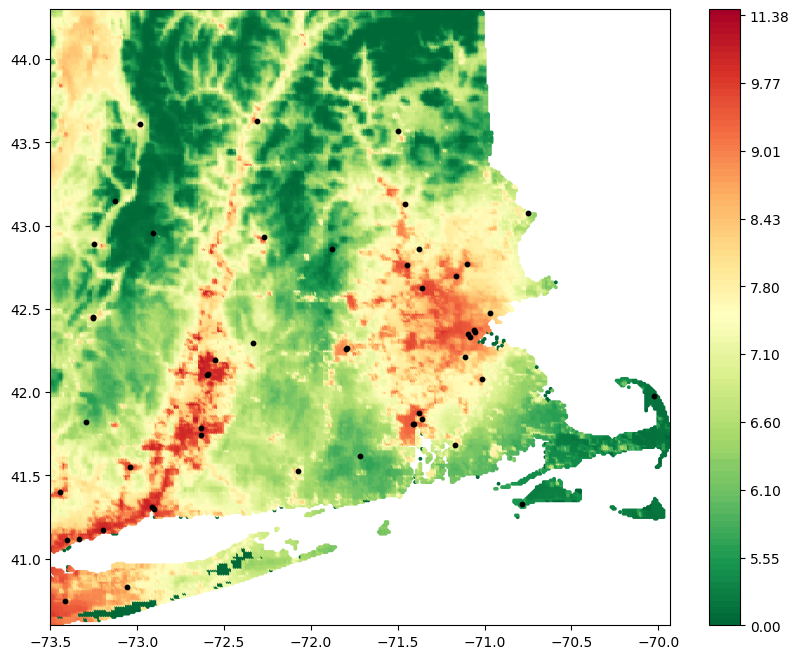

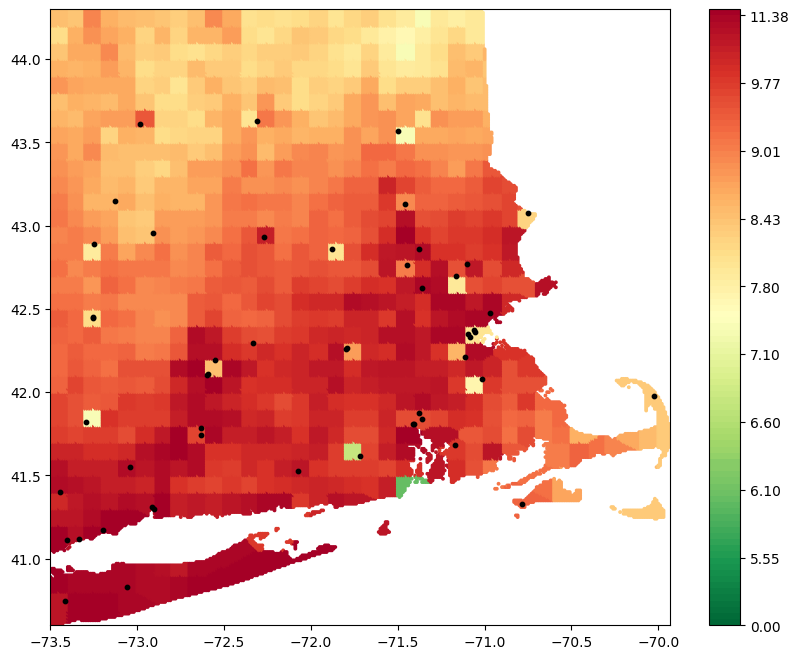

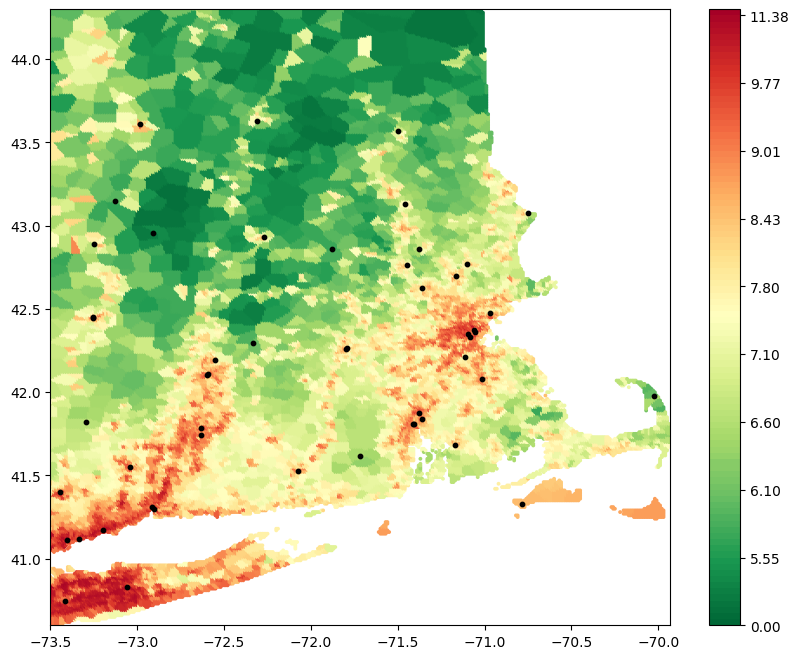

In [361]:
coordinate = np.asarray(base_model_predictions_eastMA[["lon", "lat"]].values.tolist()).astype(np.float32)
monitors = np.asarray(training_eastMA_noMI[["lon", "lat"]].values.tolist()).astype(np.float32)
base_model_names = ["pred_av", "pred_gs", "pred_caces"]

base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]] = np.where(np.isnan(base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]]), 0, base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]])
color_norm_base = make_color_norm(
    base_model_predictions_eastMA[["pred_av", "pred_gs", "pred_caces"]],   
    method="percentile")

for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_model_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(base_model_predictions_eastMA[base_model_name], coordinate,
                         monitors,
                         cmap='RdYlGn_r',
                         norm=color_norm_base, 
                         #norm_method="percentile",
                         save_addr='')

### 2. The predictive surface of individual BNE gp weights

In [362]:
bma_ensemble_weights = bma_mean_joint_samples['ensemble_weights']
ensemble_weights_val = tf.reduce_mean(bma_ensemble_weights, axis=0)

weights_dict = {
    "AV": ensemble_weights_val[:, 0],
    "GS": ensemble_weights_val[:,1],
    "CACES": ensemble_weights_val[:,2],
}
#weights_dict
color_norm_weights = make_color_norm(
    list(weights_dict.values()),#[2],   
    method="percentile")

In [363]:
ensemble_weights_var = np.var(bma_ensemble_weights, axis=0)
weights_var_dict = {
    "AV": ensemble_weights_var[:, 0],
    "GS": ensemble_weights_var[:,1],
    "CACES": ensemble_weights_var[:,2],
}
#weights_dict
color_norm_weights_var = make_color_norm(
    list(weights_var_dict.values()),#[0],   
    method="percentile")
# display(ensemble_weights_val,ensemble_weights_var)

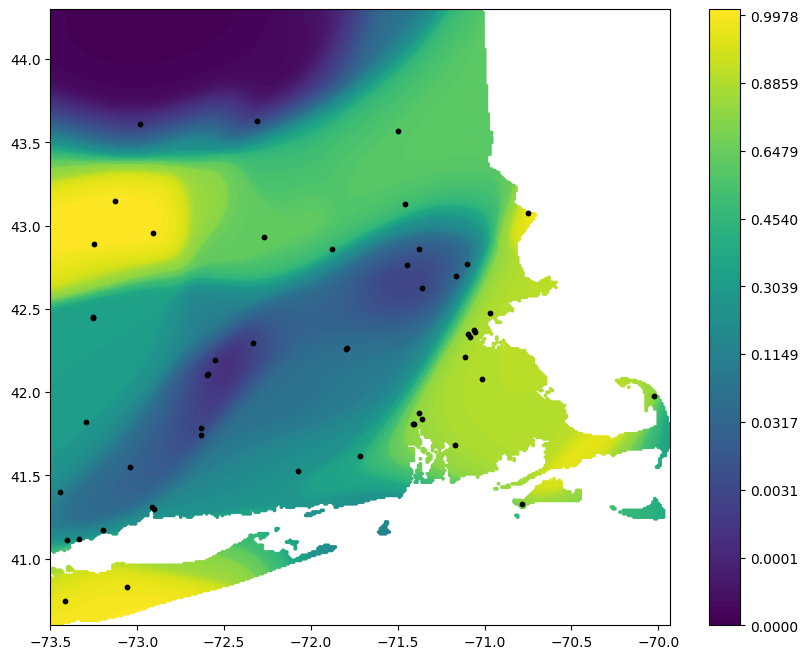

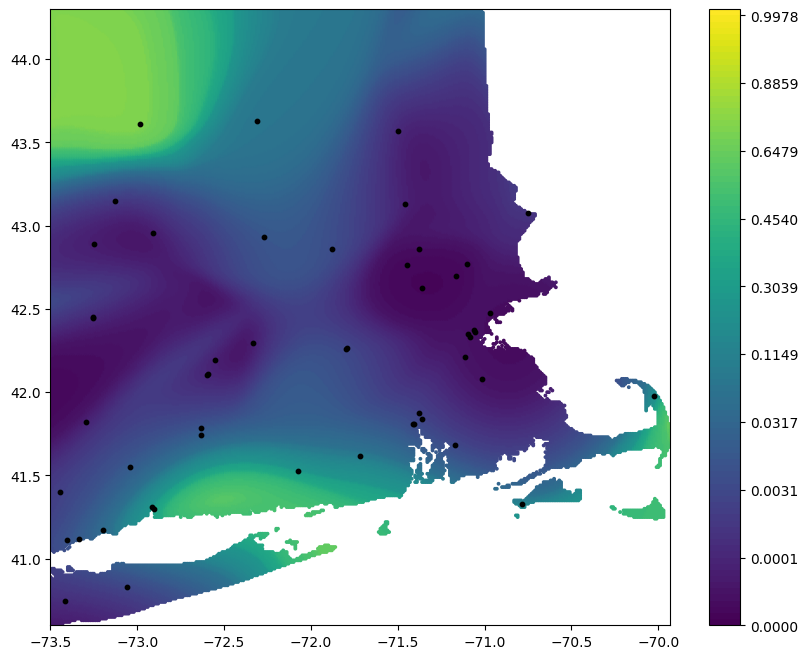

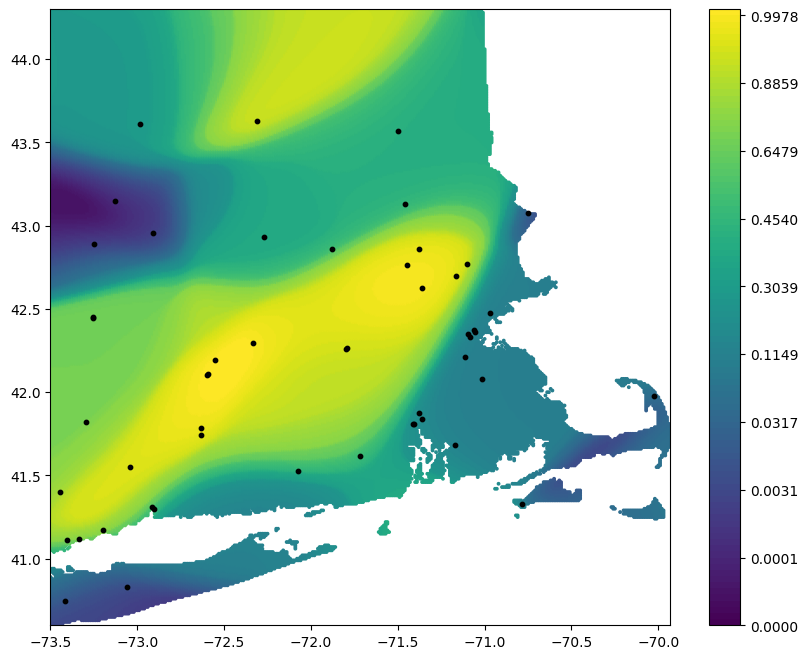

In [364]:
base_model_names = ["AV", "GS", "CACES"]
for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(weights_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

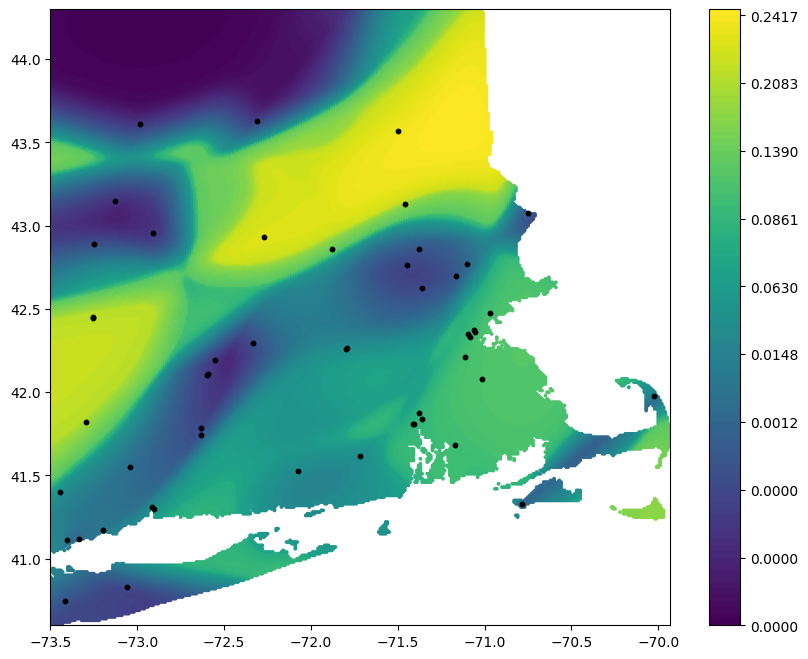

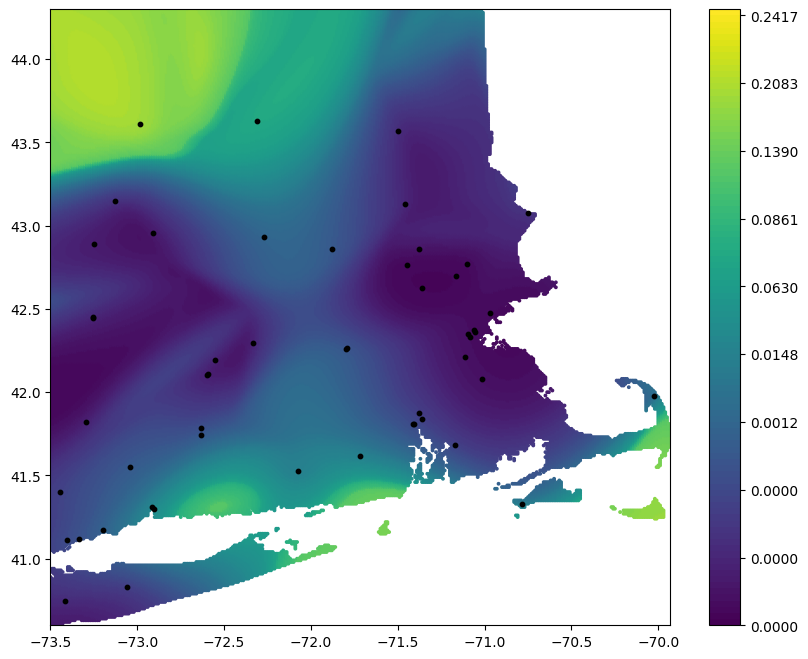

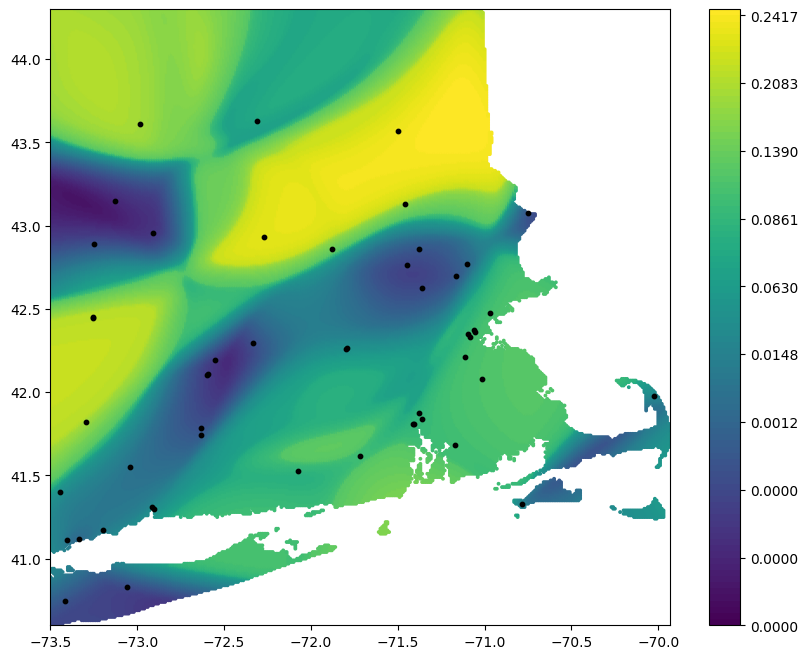

In [365]:
# plot weights' variance
for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_wvar_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(weights_var_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=color_norm_weights_var, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

#### 2.3 Base Models’ Weights’ un-transformed gp's

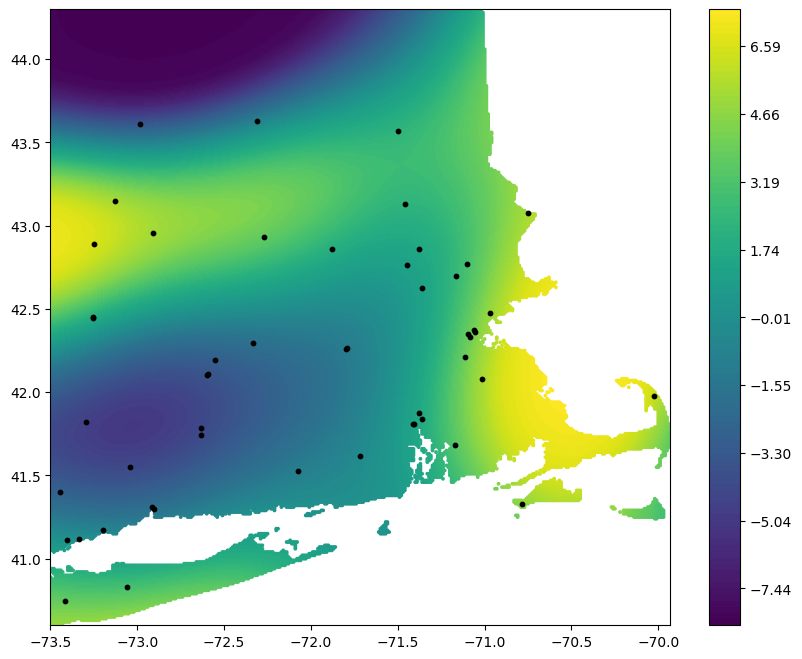

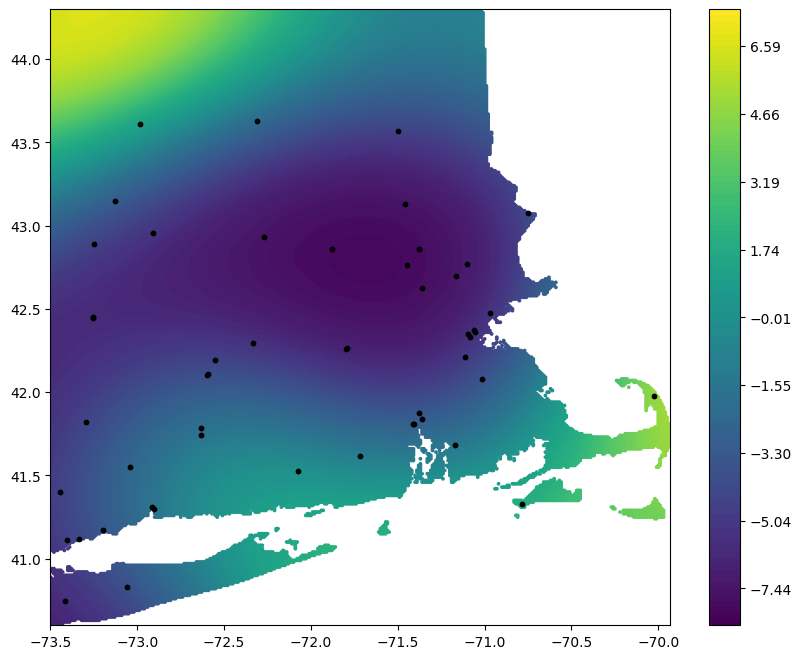

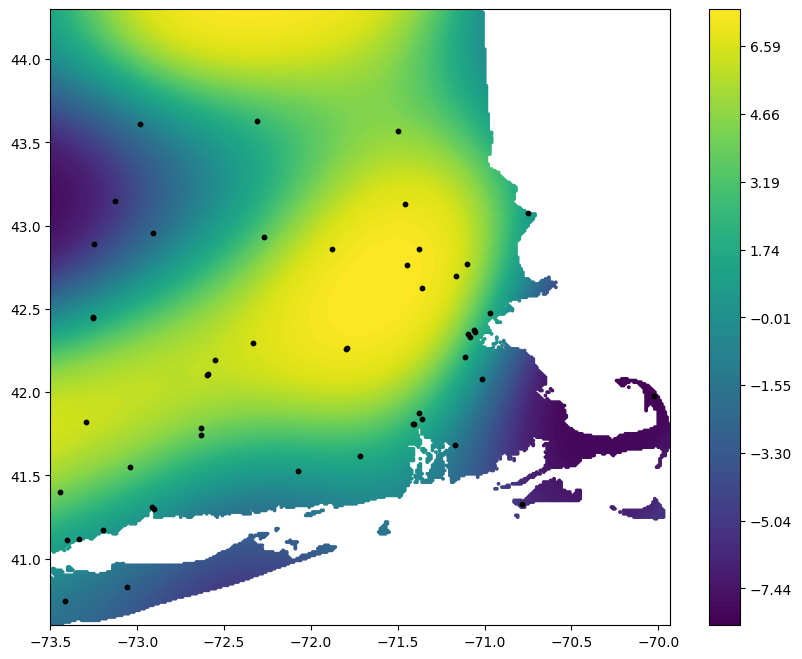

In [366]:
bma_ensemble_weights_gps = bma_mean_joint_samples['gps']
gp_weights_val = tf.reduce_mean(bma_ensemble_weights_gps, axis=0)
gp_dict = {
    "AV": gp_weights_val[:, 0],
    "GS": gp_weights_val[:,1],
    "CACES": gp_weights_val[:,2],
}

gp_color_norm_weights = make_color_norm(
    list(gp_dict.values()),#[2],   
    method="percentile")

gp_weights_var = np.var(bma_ensemble_weights_gps, axis=0)
gp_weights_var_dict = {
    "AV": gp_weights_var[:, 0],
    "GS": gp_weights_var[:,1],
    "CACES": gp_weights_var[:,2],
}

gp_color_norm_weights_var = make_color_norm(
    list(gp_weights_var_dict.values()),#[0],   
    method="percentile")


for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_untrans_gps_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(gp_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=gp_color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

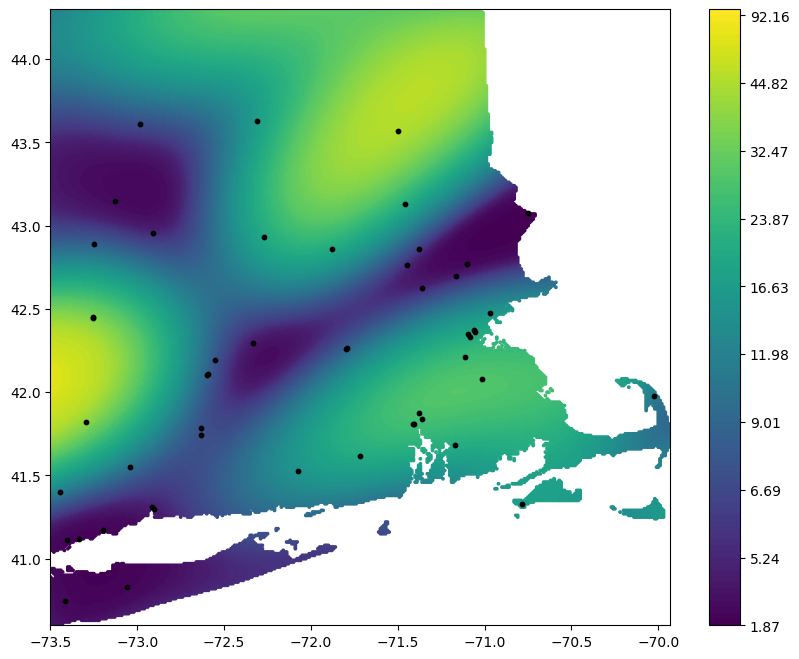

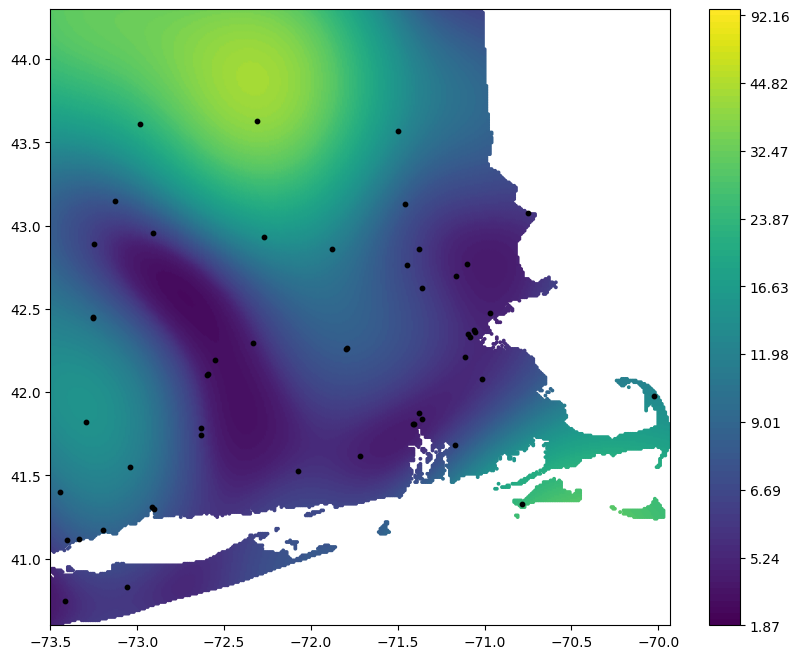

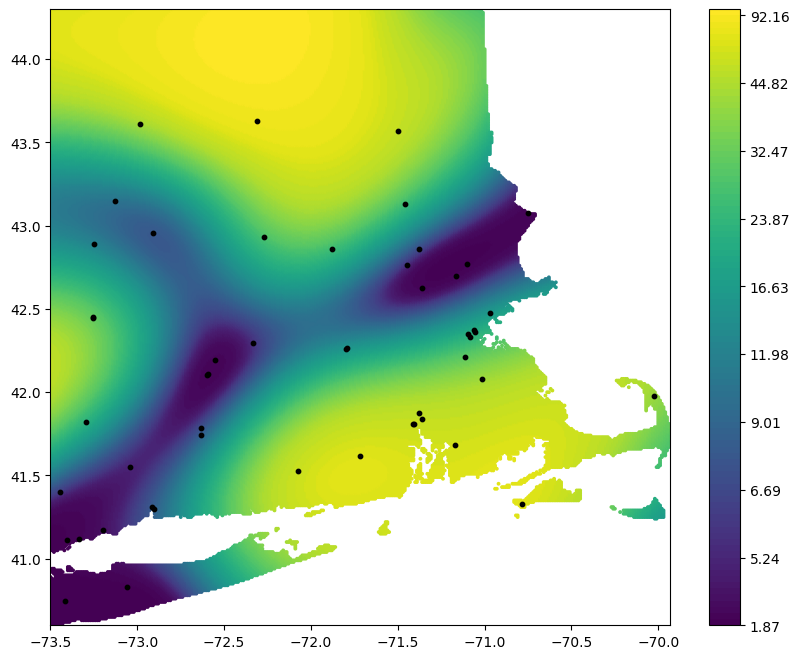

In [367]:
for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_untrans_gps_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(gp_weights_var_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=gp_color_norm_weights_var, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)

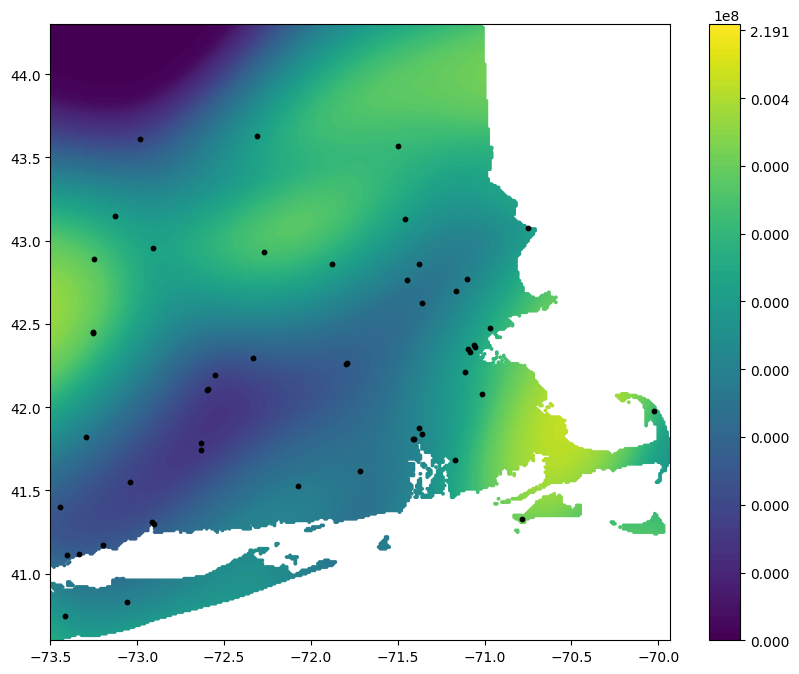

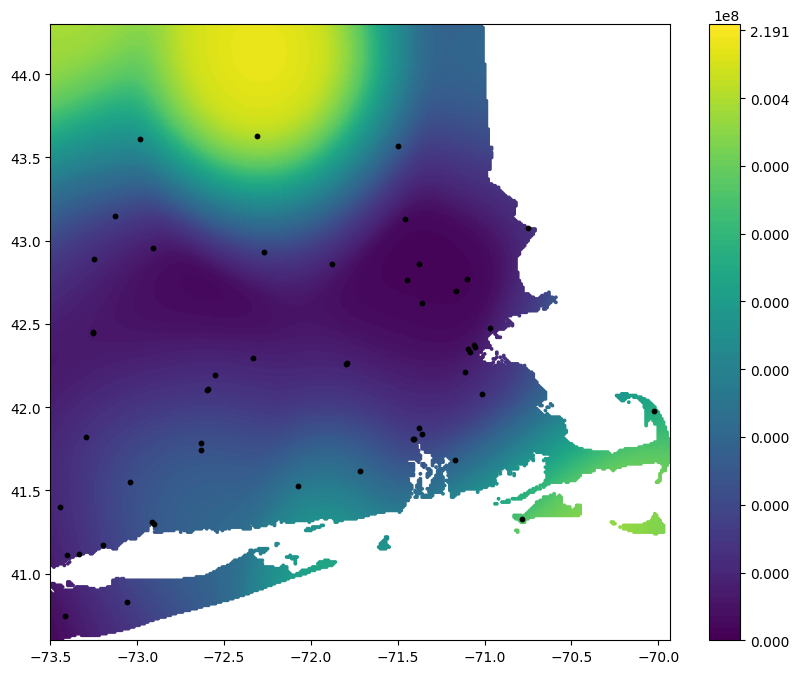

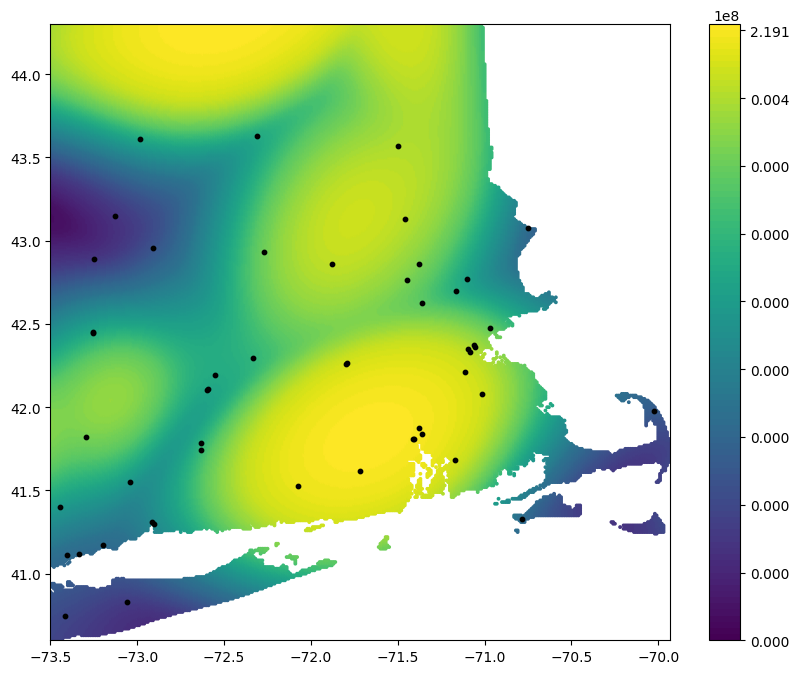

In [368]:
numerators = tf.math.exp(bma_mean_joint_samples['gps'])

numerators_val = tf.reduce_mean(numerators, axis=0)

weights_dict = {
    "AV": numerators_val[:, 0],
    "GS": numerators_val[:,1],
    "CACES": numerators_val[:,2],
}
#weights_dict
color_norm_weights = make_color_norm(
    list(weights_dict.values()),
    method="percentile")

base_model_names = ["AV", "GS", "CACES"]

for base_model_name in base_model_names:
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                             'base_untrans_gps_weights_{}_bmals_{}_r_{}_bnels_{}_r_{}.png'.format(
                                 base_model_name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
    
    posterior_heatmap_2d(weights_dict[base_model_name], coordinate,
                         monitors,
                         cmap='viridis',
                         norm=color_norm_weights, 
                         #norm_method="percentile",
                         save_addr='')
                         #save_addr=save_name)


### 3. The predictive & variance surface of BMA

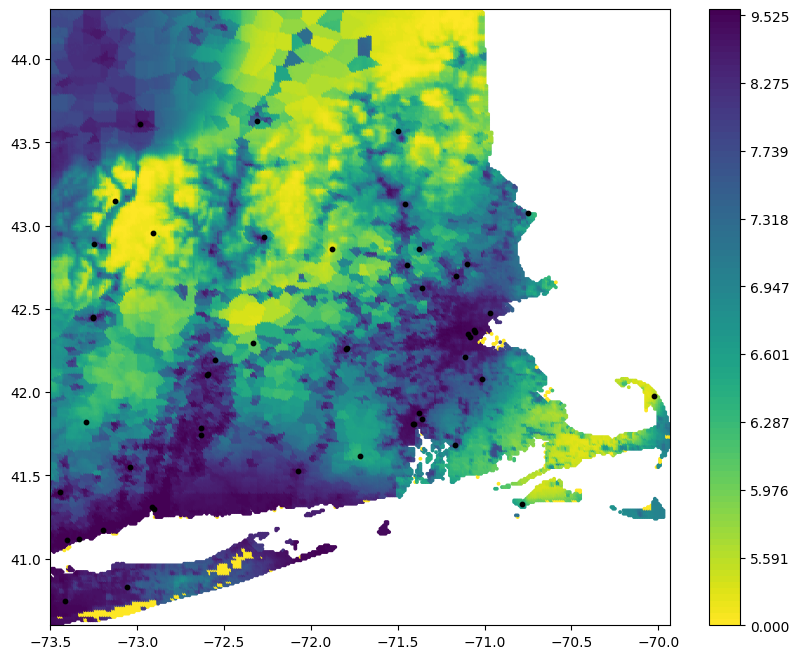

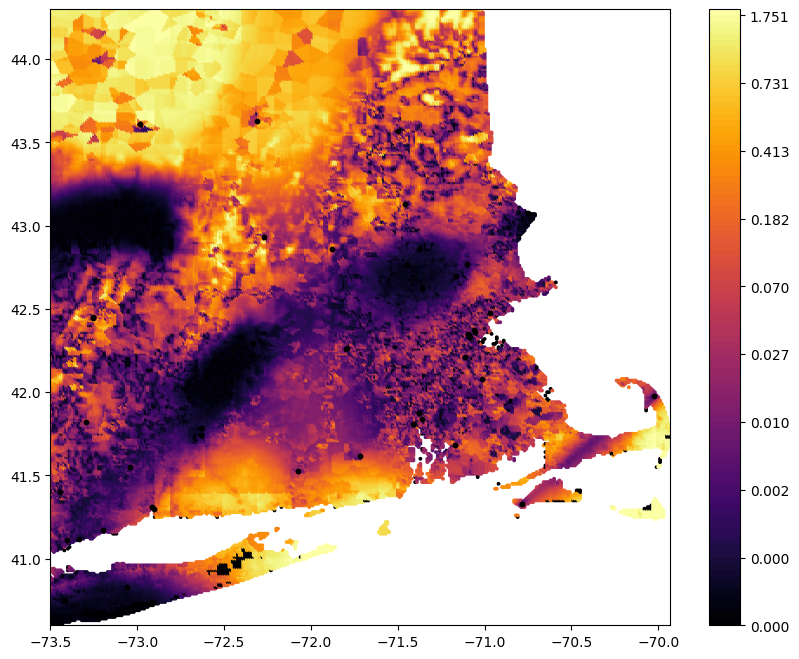

In [369]:
# BMA

color_norm_pred = make_color_norm(
    list(surface_pred_bma), 
    method="percentile")

color_norm_var = make_color_norm(
    list(surface_var_bma), 
    method="percentile")

color_norm_var_r = make_color_norm(
    list(surface_var_bma), 
    method="percentile")

color_norm = posterior_heatmap_2d(surface_pred_bma, X=coordinate, X_monitor=monitors,
                                cmap='viridis_r',
                                norm= color_norm_pred,
                                #norm_method="percentile",
                                      save_addr='')
# for value in surface_var_bma:
# #     save_name = os.path.join(_SAVE_ADDR_PREFIX,
# #                             'var_BAE_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
# #                                 name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
# #                                 bne_gp_lengthscale, bne_gp_l2_regularizer))
#     #value = np.where(np.isnan(value), 0, value)
color_norm = posterior_heatmap_2d(surface_var_bma, X=coordinate, X_monitor=monitors,
                                cmap='inferno',
                                norm= color_norm_var_r,
                                #norm_method="percentile",
                                      save_addr='')
                                #save_addr=save_name)

### 4. The predictive surface of Y_mean, residual process, and Y_mean + residual process.

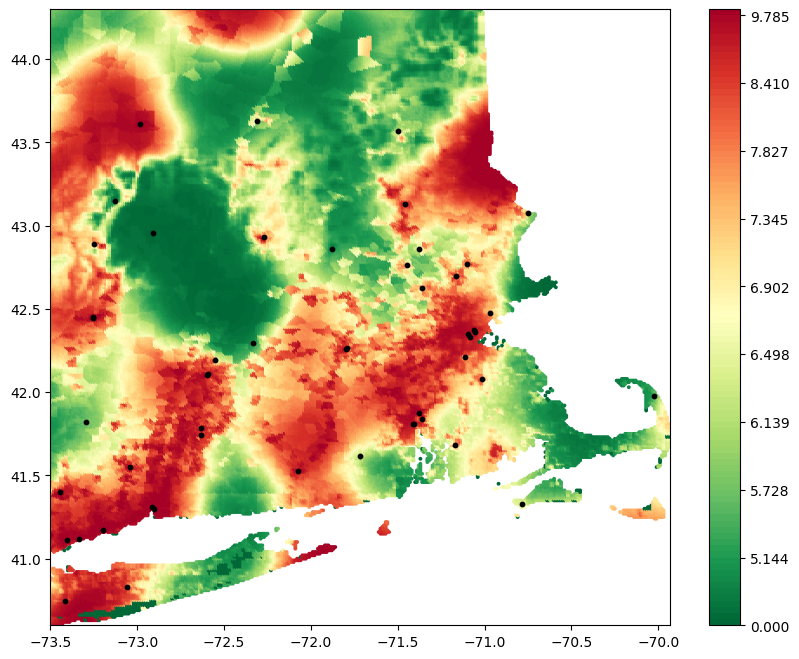

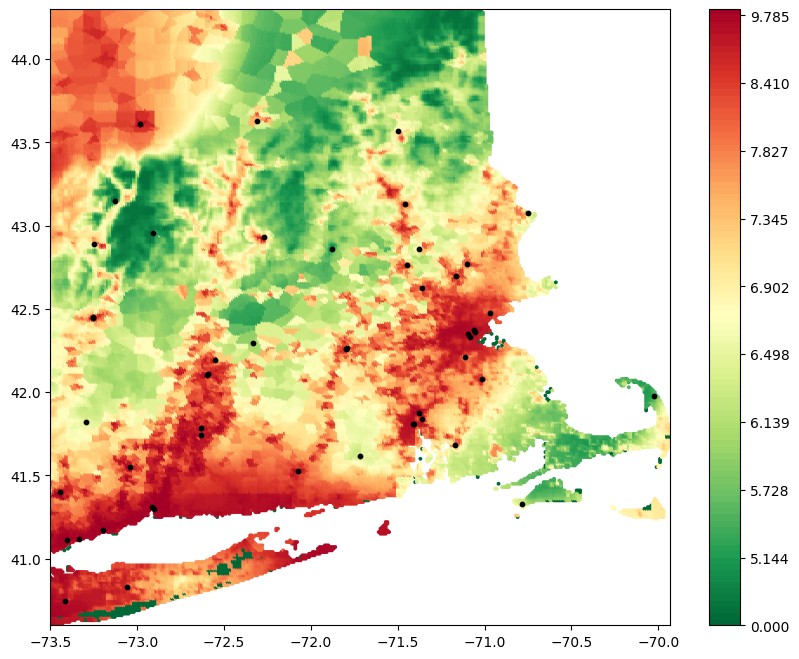

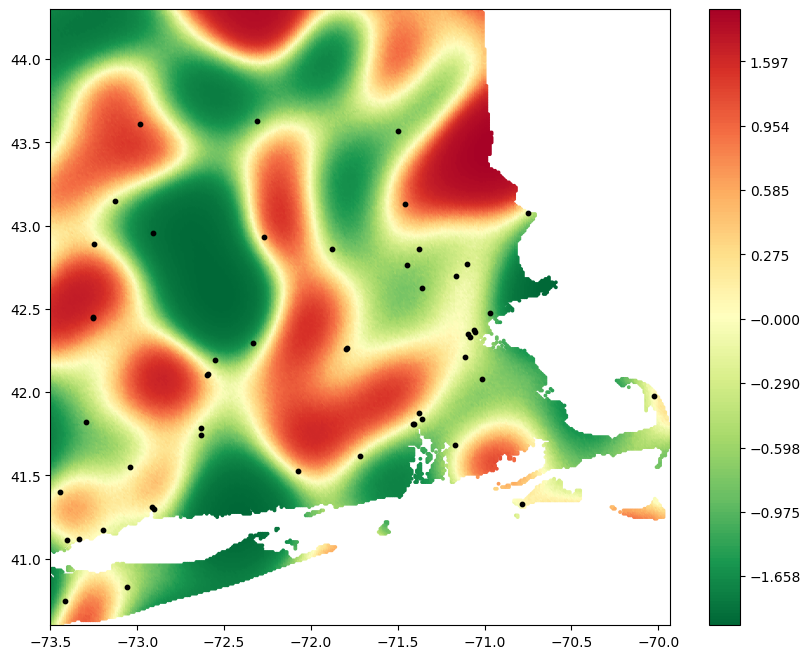

In [370]:
# BAE
color_norm_pred = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[:2][0]),
    list(surface_pred_bae.values())[:2],  
    method="percentile")

color_norm_pred_r = make_color_norm(
    #np.nan_to_num(list(surface_pred_bae.values())[2:]),
    list(surface_pred_bae.values())[2],  
    method="residual_percentile")


for name, value in surface_pred_bae.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'BAE_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))

    value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                                  cmap='RdYlGn_r',
                    norm= color_norm_pred_r if name=='resid' else color_norm_pred,
                    #norm_method="percentile",
                    save_addr='')
                    #save_addr=save_name)
    

### 5.The predictive variance of Y_mean, residual process, and Y.

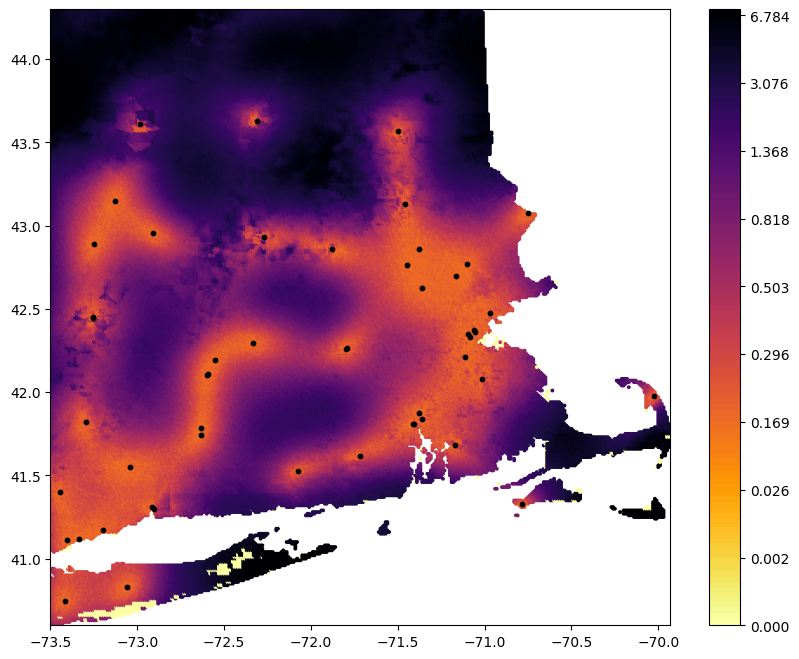

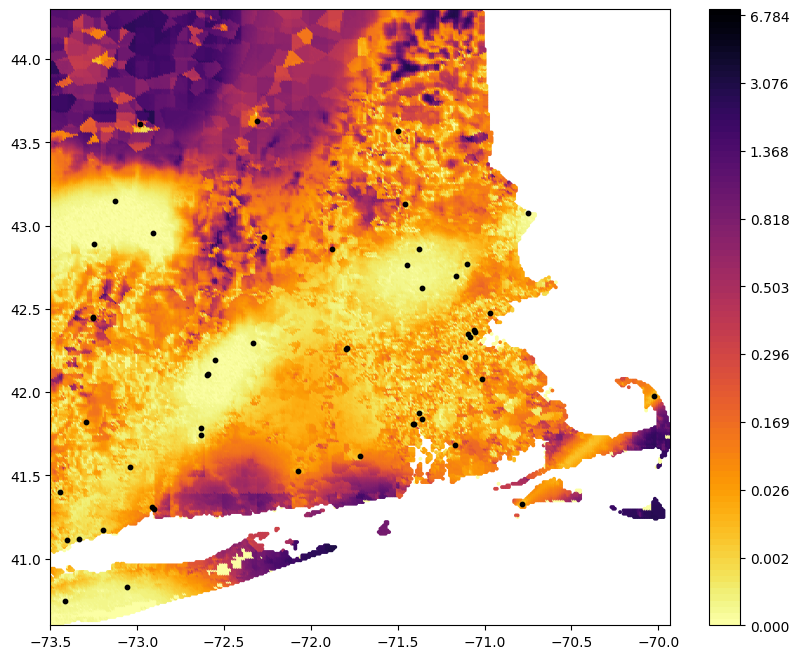

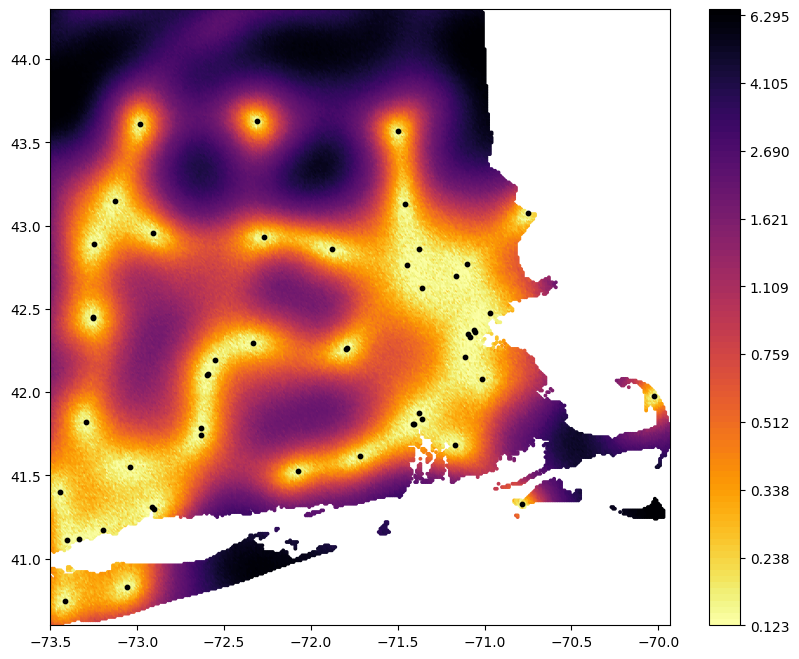

In [371]:
# BAE
color_norm_var = make_color_norm(
    list(surface_var_bae.values())[:2], 
    method="percentile")

color_norm_var_r = make_color_norm(
    list(surface_var_bae.values())[2], 
    method="percentile")


for name, value in surface_var_bae.items():
    save_name = os.path.join(_SAVE_ADDR_PREFIX,
                            'var_BAE_{}_bma:ls_{}_r_{}_bne:ls_{}_r_{}.png'.format(
                                name, bma_gp_lengthscale,  bma_gp_l2_regularizer,
                                bne_gp_lengthscale, bne_gp_l2_regularizer))
    #value = np.where(np.isnan(value), 0, value)
    color_norm = posterior_heatmap_2d(value, X=coordinate, X_monitor=monitors,
                                cmap='inferno_r',
                                norm= color_norm_var_r if name=='resid' else color_norm_var,
                                #norm_method="percentile",
                                      save_addr='')
                                #save_addr=save_name)